<a href="https://colab.research.google.com/github/sc0v0ne/OpenNotebooks/blob/main/animals_images_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Animals Images Classification

I created this notebook to study image classification, I've recently been studying TensorFlow. I wanted to put something into practice. I'll leave the link I followed as an example, which is very well detailed.

[Image classification](https://www.tensorflow.org/tutorials/images/classification?hl=pt-br)


In [1]:
!pip install kaggle --quiet

In [2]:
import os
from google.colab import userdata
os.environ['KAGGLE_USERNAME'] = userdata.get('KAGGLE_USERNAME')
os.environ['KAGGLE_KEY'] = userdata.get('KAGGLE_KEY')

In [3]:
!kaggle datasets download -d sc0v1n0/animal-picture-set

100% 3.67G/3.68G [00:52<00:00, 126MB/s]
100% 3.68G/3.68G [00:52<00:00, 74.6MB/s]


In [4]:
!unzip animal-picture-set.zip

Archive:  animal-picture-set.zip
  inflating: animals_enormous/animals_enormous/train/cats/0_cat.png  
  inflating: animals_enormous/animals_enormous/train/cats/100_cat.png  
  inflating: animals_enormous/animals_enormous/train/cats/101_cat.png  
  inflating: animals_enormous/animals_enormous/train/cats/102_cat.png  
  inflating: animals_enormous/animals_enormous/train/cats/103_cat.png  
  inflating: animals_enormous/animals_enormous/train/cats/104_cat.png  
  inflating: animals_enormous/animals_enormous/train/cats/105_cat.png  
  inflating: animals_enormous/animals_enormous/train/cats/106_cat.png  
  inflating: animals_enormous/animals_enormous/train/cats/107_cat.png  
  inflating: animals_enormous/animals_enormous/train/cats/108_cat.png  
  inflating: animals_enormous/animals_enormous/train/cats/109_cat.png  
  inflating: animals_enormous/animals_enormous/train/cats/10_cat.png  
  inflating: animals_enormous/animals_enormous/train/cats/110_cat.png  
  inflating: animals_enormous/anim

In [5]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [6]:
#!pip -q install Pillow==9.0 tensorflow==2.8.0 scikit-learn==1.0.2

In [69]:
# Python
import pathlib
import os
import shutil
import tarfile

# External
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL
import cv2

# TF
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

# Round 1

In [70]:
PARAMS = {
    # PATHS
    'PATH': '/content/animals_enormous',

    # Datasets Images
    'DS_IMAGES': 'animals_enormous',

    # DIRECTORY
    'DIRECTORY_SPLIT' : 0.2,
    'DIRECTORY_SEED': 123456,
    'DIRECTORY_IMAGE_SIZE': 312,
    'DIRECTORY_BATCH_SIZE': 32,
    'DIRECTORY_SHUFFLE': 1000,

    # AUGMENTATION
    'AUGMENTATION_RANDOM_FLIP': 'horizontal',
    'AUGMENTATION_RANDOM_ROTATION':0.5,
    'AUGMENTATION_RANDOM_ZOOM':0.4,
    'AUGMENTATION_RESCALING': 1./255,
    'AUGMENTATION_RANDOM_CONTRAST_FACTOR':0.2,
    'AUGMENTATION_RANDOM_TRANSLATION_HEIGHT_FACTOR':0.3,
    'AUGMENTATION_RANDOM_TRANSLATION_WIDTH_FACTOR':0.3,
    'AUGMENTATION_RANDOM_TRANSLATION_FILL_MODE':'reflect',
    'AUGMENTATION_RANDOM_TRANSLATION_INTERPOLATION':'bilinear',

    # CALLBACK

    'CALLBACK_MONITOR': 'val_accuracy',
    'CALLBACK_PATIENCE': 50,
    'CALLBACK_MIN_DELTA': 0.001,
    'CALLBACK_RESTORE_BEST_WEIGHTS': True,

    # MODEL

    'MODEL_DROPOUT': .5,
    'MODEL_N_CLASSES': 4,
    'MODEL_KERAS_IMAGE_SIZE': (312, 312, 3),
    'MODEL_SOFTMAX_AXIS': -1,
    'MODEL_COMPILER_METRICS': ['accuracy'],
    'MODEL_EPOCHS': 100,  #1000 #100 #50
    'MODEL_FROM_LOGITS': False,
    'MODEL_LEARNING_RATE': 0.001,
}

In [71]:
data_dir_train = pathlib.Path(os.path.join(PARAMS['PATH'], PARAMS['DS_IMAGES']), 'train').with_suffix('')
data_dir_valid = pathlib.Path(os.path.join(PARAMS['PATH'], PARAMS['DS_IMAGES']), 'valid').with_suffix('')
print(data_dir_train)
print(data_dir_valid)

/content/animals_enormous/animals_enormous/train
/content/animals_enormous/animals_enormous/valid


In [72]:
train_ds = tf.keras.utils.image_dataset_from_directory(
          data_dir_train,
          seed=PARAMS['DIRECTORY_SEED'],
          image_size=(PARAMS['DIRECTORY_IMAGE_SIZE'], PARAMS['DIRECTORY_IMAGE_SIZE']),
          batch_size=PARAMS['DIRECTORY_BATCH_SIZE'],
          )

Found 1004 files belonging to 4 classes.


In [73]:
val_ds = tf.keras.utils.image_dataset_from_directory(
        data_dir_valid,
        #validation_split=PARAMS['DIRECTORY_SPLIT'],
        #subset="validation",
        seed=PARAMS['DIRECTORY_SEED'],
        image_size=(PARAMS['DIRECTORY_IMAGE_SIZE'], PARAMS['DIRECTORY_IMAGE_SIZE']),
        batch_size=PARAMS['DIRECTORY_BATCH_SIZE'],
        )

Found 264 files belonging to 4 classes.


In [74]:
def log_directory(dataset_images, names):
  for dts, name in zip(dataset_images, names):

      length = 100
      print('-' * length)
      class_names = dts.class_names
      r_dict = {key: [] for key in class_names + ['total_images', 'total_labels']}

      print(f"\n{name:^{length}}\n")

      for images, labels in dts:

        r_dict['total_images'].append(len(images))
        r_dict['total_labels'].append(len(labels))

        lbs = labels.numpy().tolist()

        df = pd.DataFrame({'class': lbs})

        for n in np.unique(lbs):
          idxs = list(df[df['class'] == n].index)
          images_filter = len(tf.gather(images, idxs).numpy())
          r_dict[class_names[n]].append(images_filter)

      for k, v in r_dict.items():
        r_dict[k] =  np.sum(v)

      for key,value in r_dict.items():
	      print(key, ':', value)

In [75]:
log_directory([train_ds, val_ds], ['train', 'valid'])

----------------------------------------------------------------------------------------------------

                                               train                                                

cats : 251
dogs : 251
penguins : 251
turtles : 251
total_images : 1004
total_labels : 1004
----------------------------------------------------------------------------------------------------

                                               valid                                                

cats : 52
dogs : 71
penguins : 10
turtles : 131
total_images : 264
total_labels : 264


In [76]:
# Use in final this notebook
class_names_train = train_ds.class_names
class_names_val_ds = val_ds.class_names

print(class_names_train, class_names_val_ds)

class_names_global = ['Cats', 'Dogs', 'Penguins', 'Turtles']

print(class_names_global)

['cats', 'dogs', 'penguins', 'turtles'] ['cats', 'dogs', 'penguins', 'turtles']
['Cats', 'Dogs', 'Penguins', 'Turtles']


# Preview Images

In [77]:
def preview_images(dataset, size):
    class_names = dataset.class_names
    plt.figure(figsize=(size, size))
    for images, labels in dataset.take(1):
      for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

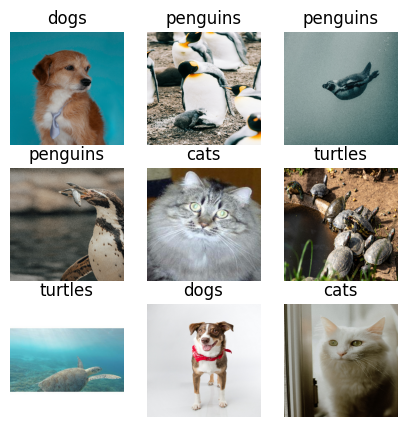

In [78]:
preview_images(train_ds, 5)

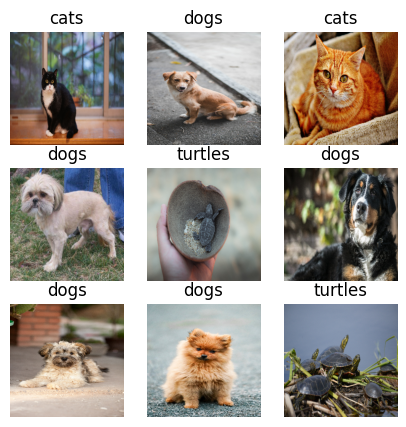

In [79]:
preview_images(val_ds, 5)

# Model


In [80]:
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(PARAMS['DIRECTORY_SHUFFLE']).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [81]:
AUGMENTATION = keras.Sequential(
  [
    layers.RandomFlip(
        PARAMS['AUGMENTATION_RANDOM_FLIP']
    ),
    layers.RandomRotation(
        PARAMS['AUGMENTATION_RANDOM_ROTATION']
    ),
    layers.RandomZoom(
        PARAMS['AUGMENTATION_RANDOM_ZOOM']
    ),
    layers.Rescaling(
        PARAMS['AUGMENTATION_RESCALING']
    ),
    layers.RandomContrast(
        factor=PARAMS['AUGMENTATION_RANDOM_CONTRAST_FACTOR'],
        seed=PARAMS['DIRECTORY_SEED']
    ),
    layers.RandomTranslation(
        height_factor=PARAMS['AUGMENTATION_RANDOM_TRANSLATION_HEIGHT_FACTOR'],
        width_factor=PARAMS['AUGMENTATION_RANDOM_TRANSLATION_WIDTH_FACTOR'],
        fill_mode=PARAMS['AUGMENTATION_RANDOM_TRANSLATION_FILL_MODE'],
        interpolation=PARAMS['AUGMENTATION_RANDOM_TRANSLATION_INTERPOLATION'],
        seed=PARAMS['DIRECTORY_SEED'],
    ),
  ]
)

In [82]:
model = Sequential([
  keras.Input(shape=PARAMS['MODEL_KERAS_IMAGE_SIZE']),
  AUGMENTATION,
  layers.Conv2D(12, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout((PARAMS['MODEL_DROPOUT'] - .2)),
  layers.Conv2D(24, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout((PARAMS['MODEL_DROPOUT'] - .1)),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout((PARAMS['MODEL_DROPOUT'] - .2)),
  layers.Conv2D(84, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout((PARAMS['MODEL_DROPOUT'] - .2)),
  layers.Conv2D(112, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout((PARAMS['MODEL_DROPOUT'] - .1)),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(len(class_names_global), activation=None, name="outputs"),
  layers.Softmax(axis=PARAMS['MODEL_SOFTMAX_AXIS']),
])

In [83]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=PARAMS['MODEL_LEARNING_RATE']),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=PARAMS['MODEL_FROM_LOGITS']),
    metrics=PARAMS['MODEL_COMPILER_METRICS'],
)


In [84]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_4 (Sequential)   (None, 312, 312, 3)       0         
                                                                 
 conv2d_10 (Conv2D)          (None, 312, 312, 12)      336       
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 156, 156, 12)      0         
 ng2D)                                                           
                                                                 
 dropout_10 (Dropout)        (None, 156, 156, 12)      0         
                                                                 
 conv2d_11 (Conv2D)          (None, 156, 156, 24)      2616      
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 78, 78, 24)        0         
 ng2D)                                                

In [85]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor=PARAMS['CALLBACK_MONITOR'],
        patience=PARAMS['CALLBACK_PATIENCE'],
        min_delta=PARAMS['CALLBACK_MIN_DELTA'],
        restore_best_weights=PARAMS['CALLBACK_RESTORE_BEST_WEIGHTS'],
    ),
    tf
    .keras
    .callbacks
    .ModelCheckpoint(
        filepath='/content/model_1.h5',
        monitor='val_accuracy',
        save_best_only=True,
        mode='max',
        verbose=1
        ),
]

In [86]:
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=PARAMS['MODEL_EPOCHS'],
  callbacks=[callbacks],
)

Epoch 1/100
32/32 [==============================] - ETA: 0s - loss: 1.4292 - accuracy: 0.2510
Epoch 1: val_accuracy improved from -inf to 0.20455, saving model to /content/model_1.h5
32/32 [==============================] - 165s 1s/step - loss: 1.4292 - accuracy: 0.2510 - val_loss: 1.3868 - val_accuracy: 0.2045
Epoch 2/100
 1/32 [..............................] - ETA: 3s - loss: 1.3901 - accuracy: 0.1562

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


32/32 [==============================] - ETA: 0s - loss: 1.3869 - accuracy: 0.2600
Epoch 2: val_accuracy did not improve from 0.20455
32/32 [==============================] - 3s 87ms/step - loss: 1.3869 - accuracy: 0.2600 - val_loss: 1.3876 - val_accuracy: 0.0985
Epoch 3/100
32/32 [==============================] - ETA: 0s - loss: 1.3863 - accuracy: 0.2600
Epoch 3: val_accuracy did not improve from 0.20455
32/32 [==============================] - 3s 86ms/step - loss: 1.3863 - accuracy: 0.2600 - val_loss: 1.3836 - val_accuracy: 0.1970
Epoch 4/100
32/32 [==============================] - ETA: 0s - loss: 1.3755 - accuracy: 0.3078
Epoch 4: val_accuracy did not improve from 0.20455
32/32 [==============================] - 3s 87ms/step - loss: 1.3755 - accuracy: 0.3078 - val_loss: 1.3812 - val_accuracy: 0.1970
Epoch 5/100
32/32 [==============================] - ETA: 0s - loss: 1.3870 - accuracy: 0.2560
Epoch 5: val_accuracy did not improve from 0.20455
32/32 [==============================]

-----

# Training Results

In [87]:
DICT_HISTORY = {
    'HISTORY_ACC': history.history['accuracy'],
    'HISTORY_VAL_ACC': history.history['val_accuracy'],
    'HISTORY_LOSS': history.history['loss'],
    'HISTORY_VAL_LOSS': history.history['val_loss'],

    'EPOCHS_TO_TRAIN': range(len(history.history['val_accuracy'])),
}

In [88]:
def train_results(results):

    # ACCURACY
    plt.figure(figsize=(30, 5))
    plt.subplot(1, 2, 1)
    plt.plot(results['EPOCHS_TO_TRAIN'], results['HISTORY_ACC'], label='Training Accuracy')
    plt.plot(results['EPOCHS_TO_TRAIN'], results['HISTORY_VAL_ACC'], label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    # LOSS
    plt.subplot(1, 2, 2)
    plt.plot(results['EPOCHS_TO_TRAIN'], results['HISTORY_LOSS'], label='Training Loss')
    plt.plot(results['EPOCHS_TO_TRAIN'], results['HISTORY_VAL_LOSS'], label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

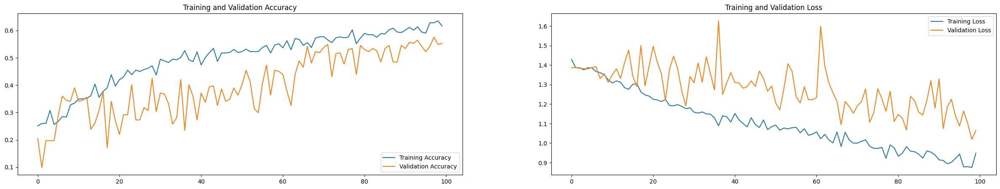

In [89]:
train_results(DICT_HISTORY)

------

# Testing Model

In [90]:
import random
from PIL import Image

def get_animal(dir_ ,name):
    #n_random = random.randrange(250, 300)
    animal = Image.open(
                os.path.join(PARAMS['PATH'], PARAMS['DS_IMAGES'], 'valid', f'{dir_}', f'{name}.png')
            )
    animal = np.array(animal)
    img_ = tf.image.resize(animal, [312,312])
    img_ = tf.convert_to_tensor([img_])

    prediction = model.predict(img_)
    prediction = list(tf.argmax(prediction, axis=1).numpy())
    name_class = [class_names_global[x] for x in prediction]


    plt.figure(figsize=(5, 5))
    plt.imshow(animal.astype("uint8"))
    plt.title(f'Prediction: {name_class[0]} \n y_true: {name}')
    plt.axis("off")



1/1 [==============================] - 0s 97ms/step


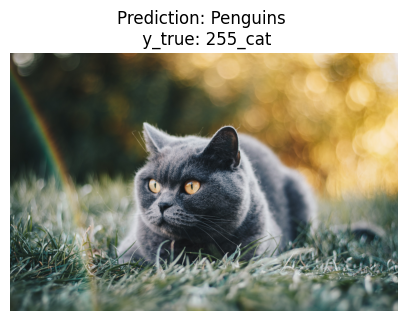

In [91]:
get_animal('cats','255_cat')

1/1 [==============================] - 0s 18ms/step


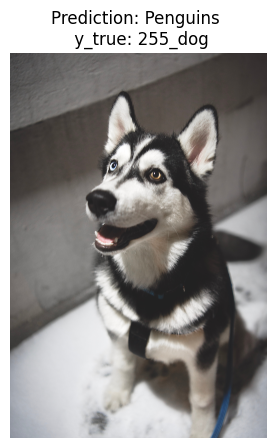

In [92]:
get_animal('dogs', '255_dog')

1/1 [==============================] - 0s 26ms/step


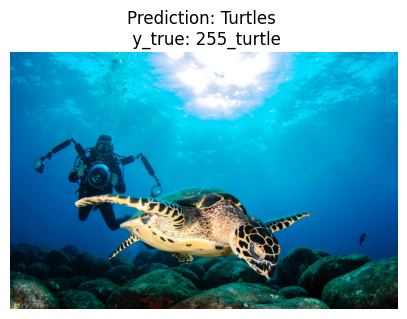

In [93]:
get_animal('turtles', '255_turtle')

1/1 [==============================] - 0s 18ms/step


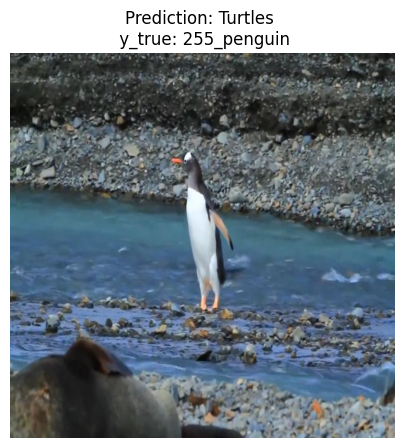

In [94]:
get_animal('penguins', '255_penguin')

In [95]:
model_1 = tf.keras.models.load_model('/content/model_1.h5')

In [96]:
import random
from PIL import Image

def prediction_animal(image, model):

    img_ = tf.convert_to_tensor([image])

    prediction = model.predict(img_)
    prediction = list(tf.argmax(prediction, axis=1).numpy())
    name_class = [class_names_global[x] for x in prediction]

    return name_class[0]


def preview_images(dataset, w, h, model):
    class_names = class_names_global
    plt.figure(figsize=(w, h))
    for images, labels in dataset.take(1):
        for i in range(15):
            ax = plt.subplot(5, 5, i + 1)
            y_one_pred = prediction_animal(images[i], model)
            plt.imshow(images[i].numpy().astype("uint8"))
            if class_names[labels[i]] == y_one_pred:
                plt.title(f'y_true: {class_names[labels[i]]} \n y_pred: {y_one_pred}', c='green', fontsize=18)
            else:
                plt.title(f'y_true: {class_names[labels[i]]} \n y_pred: {y_one_pred}', c='red', fontsize=18)

            plt.axis("off")


1/1 [==============================] - 0s 20ms/step


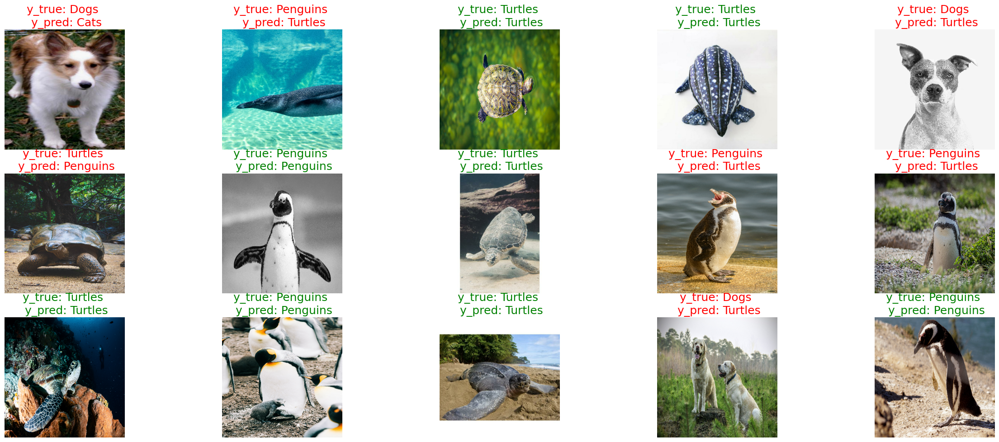

In [97]:
preview_images(train_ds, 30, 20, model_1)

1/1 [==============================] - 0s 18ms/step


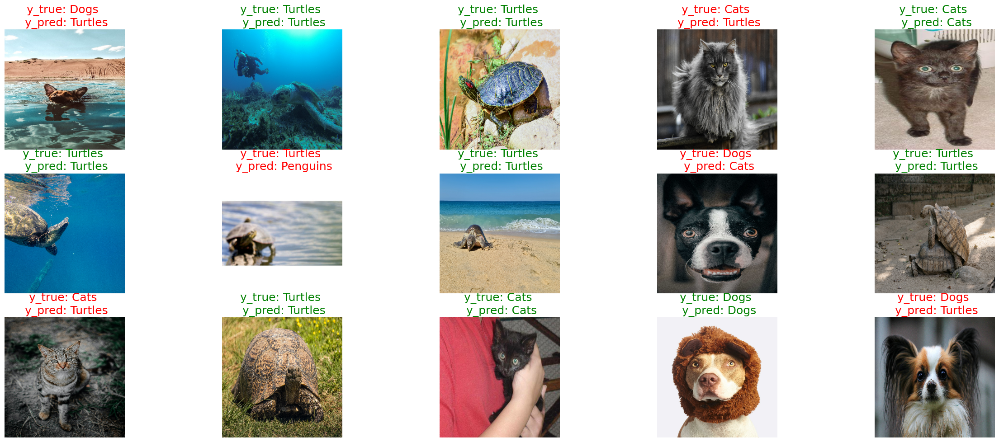

In [98]:
preview_images(val_ds, 30, 20, model_1)

--------

# Confusion Matrix



In [99]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrix(y_true, y_pred, dataset):
    norms = [None, 'all', 'true', 'pred']
    fig, ax = plt.subplots(1, len(norms), figsize=(24, 6))
    for idx, norm in enumerate(norms):
        ConfusionMatrixDisplay.from_predictions(y_true,
                                                y_pred,
                                                labels=np.arange(len(class_names_global)),
                                                normalize=norm,
                                                display_labels=class_names_global,
                                                colorbar=False,
                                                ax=ax[idx],
                                                cmap='Blues')
        ax[idx].set_title(f'Norm={norm}')

In [100]:
def return_y_true_and_pred(dataset, model):
  labels = []
  for img, label in dataset:
    labels.append(label)
  y_true =  list(tf.concat(labels, axis=0).numpy())
  pred = model.predict(dataset)
  pred = np.argmax(pred, axis=1)
  assert len(y_true) == len(pred)
  return y_true, pred

32/32 [==============================] - 1s 22ms/step


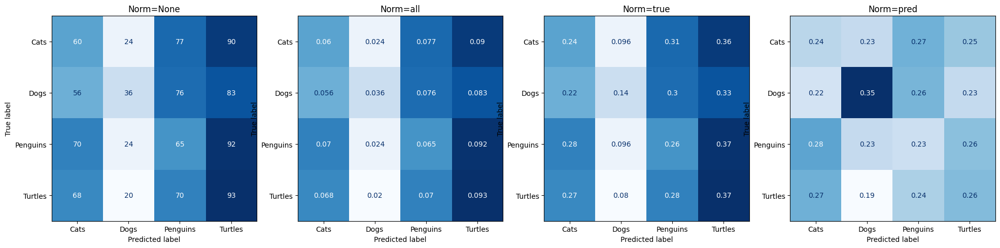

In [101]:
y_true, pred = return_y_true_and_pred(train_ds, model_1)
plot_confusion_matrix(y_true, pred, train_ds)

9/9 [==============================] - 0s 19ms/step


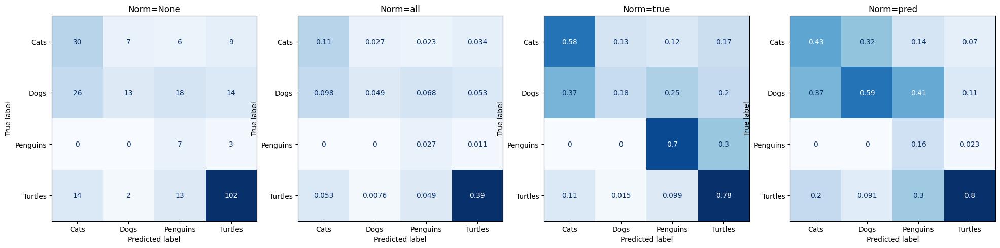

In [102]:
y_true, pred = return_y_true_and_pred(val_ds, model_1)
plot_confusion_matrix(y_true, pred, val_ds)

# Round 2

In [103]:
PARAMS = {
    # PATHS
    'PATH': '/content/animals_enormous',

    # Datasets Images
    'DS_IMAGES': 'animals_enormous',

    # DIRECTORY
    'DIRECTORY_SPLIT' : 0.2,
    'DIRECTORY_SEED': 123456,
    'DIRECTORY_IMAGE_SIZE': 412,
    'DIRECTORY_BATCH_SIZE': 64,
    'DIRECTORY_SHUFFLE': 1000,

    # AUGMENTATION
    'AUGMENTATION_RANDOM_FLIP': 'horizontal',
    'AUGMENTATION_RANDOM_ROTATION':0.1,
    'AUGMENTATION_RANDOM_ZOOM':0.7,
    'AUGMENTATION_RESCALING': 1./255,
    'AUGMENTATION_RANDOM_CONTRAST_FACTOR':0.2,
    'AUGMENTATION_RANDOM_TRANSLATION_HEIGHT_FACTOR':0.1,
    'AUGMENTATION_RANDOM_TRANSLATION_WIDTH_FACTOR':0.1,
    'AUGMENTATION_RANDOM_TRANSLATION_FILL_MODE':'reflect',
    'AUGMENTATION_RANDOM_TRANSLATION_INTERPOLATION':'bilinear',

    # CALLBACK

    'CALLBACK_MONITOR': 'val_accuracy',
    'CALLBACK_PATIENCE': 50,
    'CALLBACK_MIN_DELTA': 0.001,
    'CALLBACK_RESTORE_BEST_WEIGHTS': True,

    # MODEL

    'MODEL_DROPOUT': .7,
    'MODEL_N_CLASSES': 4,
    'MODEL_KERAS_IMAGE_SIZE': (412, 412, 3),
    'MODEL_SOFTMAX_AXIS': -1,
    'MODEL_COMPILER_METRICS': ['accuracy'],
    'MODEL_EPOCHS': 100,  #1000 #100 #50
    'MODEL_FROM_LOGITS': False,
    'MODEL_LEARNING_RATE': 0.001,
}

In [104]:
data_dir_train = pathlib.Path(os.path.join(PARAMS['PATH'], PARAMS['DS_IMAGES']), 'train').with_suffix('')
data_dir_valid = pathlib.Path(os.path.join(PARAMS['PATH'], PARAMS['DS_IMAGES']), 'valid').with_suffix('')
print(data_dir_train)
print(data_dir_valid)

/content/animals_enormous/animals_enormous/train
/content/animals_enormous/animals_enormous/valid


In [105]:
train_ds = tf.keras.utils.image_dataset_from_directory(
          data_dir_train,
          #validation_split=PARAMS['DIRECTORY_SPLIT'],
          #subset="training",
          seed=PARAMS['DIRECTORY_SEED'],
          image_size=(PARAMS['DIRECTORY_IMAGE_SIZE'], PARAMS['DIRECTORY_IMAGE_SIZE']),
          batch_size=PARAMS['DIRECTORY_BATCH_SIZE'],
          )

Found 1004 files belonging to 4 classes.


In [106]:
val_ds = tf.keras.utils.image_dataset_from_directory(
        data_dir_valid,
        #validation_split=PARAMS['DIRECTORY_SPLIT'],
        #subset="validation",
        seed=PARAMS['DIRECTORY_SEED'],
        image_size=(PARAMS['DIRECTORY_IMAGE_SIZE'], PARAMS['DIRECTORY_IMAGE_SIZE']),
        batch_size=PARAMS['DIRECTORY_BATCH_SIZE'],
        )

Found 264 files belonging to 4 classes.


In [107]:
def log_directory(dataset_images, names):
  for dts, name in zip(dataset_images, names):

      length = 100
      print('-' * length)
      class_names = dts.class_names
      r_dict = {key: [] for key in class_names + ['total_images', 'total_labels']}

      print(f"\n{name:^{length}}\n")

      for images, labels in dts:

        r_dict['total_images'].append(len(images))
        r_dict['total_labels'].append(len(labels))

        lbs = labels.numpy().tolist()

        df = pd.DataFrame({'class': lbs})

        for n in np.unique(lbs):
          idxs = list(df[df['class'] == n].index)
          images_filter = len(tf.gather(images, idxs).numpy())
          r_dict[class_names[n]].append(images_filter)

      for k, v in r_dict.items():
        r_dict[k] =  np.sum(v)

      for key,value in r_dict.items():
	      print(key, ':', value)

In [108]:
log_directory([train_ds, val_ds], ['train', 'valid'])

----------------------------------------------------------------------------------------------------

                                               train                                                

cats : 251
dogs : 251
penguins : 251
turtles : 251
total_images : 1004
total_labels : 1004
----------------------------------------------------------------------------------------------------

                                               valid                                                

cats : 52
dogs : 71
penguins : 10
turtles : 131
total_images : 264
total_labels : 264


In [109]:
# Use in final this notebook
class_names_train = train_ds.class_names
class_names_val_ds = val_ds.class_names

print(class_names_train, class_names_val_ds)

class_names_global = ['Cats', 'Dogs', 'Penguins', 'Turtles']

print(class_names_global)

['cats', 'dogs', 'penguins', 'turtles'] ['cats', 'dogs', 'penguins', 'turtles']
['Cats', 'Dogs', 'Penguins', 'Turtles']


# Model


In [110]:
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(PARAMS['DIRECTORY_SHUFFLE']).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [111]:
AUGMENTATION = keras.Sequential(
  [
    layers.RandomFlip(
        PARAMS['AUGMENTATION_RANDOM_FLIP']
    ),
    layers.RandomRotation(
        PARAMS['AUGMENTATION_RANDOM_ROTATION']
    ),
    layers.RandomZoom(
        PARAMS['AUGMENTATION_RANDOM_ZOOM']
    ),
    layers.Rescaling(
        PARAMS['AUGMENTATION_RESCALING']
    ),
    layers.RandomContrast(
        factor=PARAMS['AUGMENTATION_RANDOM_CONTRAST_FACTOR'],
        seed=PARAMS['DIRECTORY_SEED']
    ),
    layers.RandomTranslation(
        height_factor=PARAMS['AUGMENTATION_RANDOM_TRANSLATION_HEIGHT_FACTOR'],
        width_factor=PARAMS['AUGMENTATION_RANDOM_TRANSLATION_WIDTH_FACTOR'],
        fill_mode=PARAMS['AUGMENTATION_RANDOM_TRANSLATION_FILL_MODE'],
        interpolation=PARAMS['AUGMENTATION_RANDOM_TRANSLATION_INTERPOLATION'],
        seed=PARAMS['DIRECTORY_SEED'],
    ),
  ]
)

In [112]:
model = Sequential([
  keras.Input(shape=PARAMS['MODEL_KERAS_IMAGE_SIZE']),
  AUGMENTATION,
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout((PARAMS['MODEL_DROPOUT'] - .6)),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout((PARAMS['MODEL_DROPOUT'] - .4)),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout((PARAMS['MODEL_DROPOUT'] - .3)),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout((PARAMS['MODEL_DROPOUT'] - .3)),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout((PARAMS['MODEL_DROPOUT'] - .1)),
  layers.Flatten(),
  layers.Dense(32, activation='relu'),
  layers.Dense(len(class_names_global), activation=None, name="outputs"),
  layers.Softmax(axis=PARAMS['MODEL_SOFTMAX_AXIS']),
])

In [113]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=PARAMS['MODEL_LEARNING_RATE']),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=PARAMS['MODEL_FROM_LOGITS']),
    metrics=PARAMS['MODEL_COMPILER_METRICS'],
)


In [114]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_6 (Sequential)   (None, 412, 412, 3)       0         
                                                                 
 conv2d_15 (Conv2D)          (None, 412, 412, 64)      1792      
                                                                 
 max_pooling2d_15 (MaxPooli  (None, 206, 206, 64)      0         
 ng2D)                                                           
                                                                 
 dropout_15 (Dropout)        (None, 206, 206, 64)      0         
                                                                 
 conv2d_16 (Conv2D)          (None, 206, 206, 64)      36928     
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 103, 103, 64)      0         
 ng2D)                                                

In [115]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor=PARAMS['CALLBACK_MONITOR'],
        patience=PARAMS['CALLBACK_PATIENCE'],
        min_delta=PARAMS['CALLBACK_MIN_DELTA'],
        restore_best_weights=PARAMS['CALLBACK_RESTORE_BEST_WEIGHTS'],
    ),
    tf
    .keras
    .callbacks
    .ModelCheckpoint(
        filepath='/content/model_2.h5',
        monitor='val_accuracy',
        save_best_only=True,
        mode='max',
        verbose=1
        ),
]

In [116]:
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=PARAMS['MODEL_EPOCHS'],
  callbacks=[callbacks],
)

Epoch 1/100
16/16 [==============================] - ETA: 0s - loss: 1.4036 - accuracy: 0.2470
Epoch 1: val_accuracy improved from -inf to 0.33333, saving model to /content/model_2.h5
16/16 [==============================] - 185s 4s/step - loss: 1.4036 - accuracy: 0.2470 - val_loss: 1.3833 - val_accuracy: 0.3333


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Epoch 2/100
16/16 [==============================] - ETA: 0s - loss: 1.3856 - accuracy: 0.2699
Epoch 2: val_accuracy did not improve from 0.33333
16/16 [==============================] - 16s 1s/step - loss: 1.3856 - accuracy: 0.2699 - val_loss: 1.3856 - val_accuracy: 0.2689
Epoch 3/100
16/16 [==============================] - ETA: 0s - loss: 1.3828 - accuracy: 0.2869
Epoch 3: val_accuracy did not improve from 0.33333
16/16 [==============================] - 16s 1s/step - loss: 1.3828 - accuracy: 0.2869 - val_loss: 1.3852 - val_accuracy: 0.2576
Epoch 4/100
16/16 [==============================] - ETA: 0s - loss: 1.3697 - accuracy: 0.3118
Epoch 4: val_accuracy improved from 0.33333 to 0.44697, saving model to /content/model_2.h5
16/16 [==============================] - 16s 1s/step - loss: 1.3697 - accuracy: 0.3118 - val_loss: 1.3467 - val_accuracy: 0.4470
Epoch 5/100
16/16 [==============================] - ETA: 0s - loss: 1.3282 - accuracy: 0.3257
Epoch 5: val_accuracy did not improve f

-----

# Training Results

In [117]:
DICT_HISTORY = {
    'HISTORY_ACC': history.history['accuracy'],
    'HISTORY_VAL_ACC': history.history['val_accuracy'],
    'HISTORY_LOSS': history.history['loss'],
    'HISTORY_VAL_LOSS': history.history['val_loss'],

    'EPOCHS_TO_TRAIN': range(len(history.history['val_accuracy'])),
}

In [118]:
def train_results(results):

    # ACCURACY
    plt.figure(figsize=(30, 5))
    plt.subplot(1, 2, 1)
    plt.plot(results['EPOCHS_TO_TRAIN'], results['HISTORY_ACC'], label='Training Accuracy')
    plt.plot(results['EPOCHS_TO_TRAIN'], results['HISTORY_VAL_ACC'], label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    # LOSS
    plt.subplot(1, 2, 2)
    plt.plot(results['EPOCHS_TO_TRAIN'], results['HISTORY_LOSS'], label='Training Loss')
    plt.plot(results['EPOCHS_TO_TRAIN'], results['HISTORY_VAL_LOSS'], label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

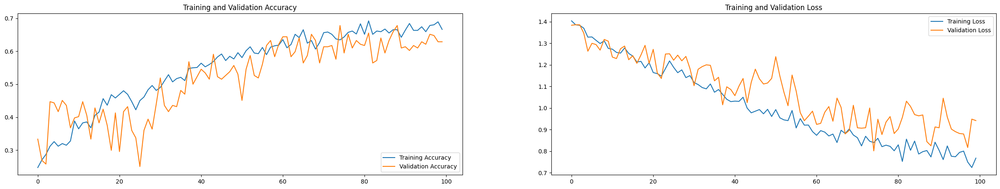

In [119]:
train_results(DICT_HISTORY)

------

# Testing Model

In [120]:
model_2 = tf.keras.models.load_model('/content/model_2.h5')

In [121]:
import random
from PIL import Image

def get_animal(dir_ ,name, model):
    #n_random = random.randrange(250, 300)
    animal = Image.open(
                os.path.join(PARAMS['PATH'], PARAMS['DS_IMAGES'], 'valid', f'{dir_}', f'{name}.png')
            )
    animal = np.array(animal)
    img_ = tf.image.resize(animal, [412,412])
    img_ = tf.convert_to_tensor([img_])

    prediction = model.predict(img_)
    prediction = list(tf.argmax(prediction, axis=1).numpy())
    name_class = [class_names_global[x] for x in prediction]


    plt.figure(figsize=(5, 5))
    plt.imshow(animal.astype("uint8"))
    plt.title(f'Prediction: {name_class[0]} \n y_true: {name}')
    plt.axis("off")



In [122]:
import random
from PIL import Image

def prediction_animal(image, model):

    img_ = tf.convert_to_tensor([image])

    prediction = model.predict(img_)
    prediction = list(tf.argmax(prediction, axis=1).numpy())
    name_class = [class_names_global[x] for x in prediction]

    return name_class[0]


def preview_images(dataset, w, h, model):
    class_names = class_names_global
    plt.figure(figsize=(w, h))
    for images, labels in dataset.take(1):
        for i in range(15):
            ax = plt.subplot(5, 5, i + 1)
            y_one_pred = prediction_animal(images[i], model)
            plt.imshow(images[i].numpy().astype("uint8"))
            if class_names[labels[i]] == y_one_pred:
                plt.title(f'y_true: {class_names[labels[i]]} \n y_pred: {y_one_pred}', c='green', fontsize=18)
            else:
                plt.title(f'y_true: {class_names[labels[i]]} \n y_pred: {y_one_pred}', c='red', fontsize=18)

            plt.axis("off")


1/1 [==============================] - 0s 20ms/step


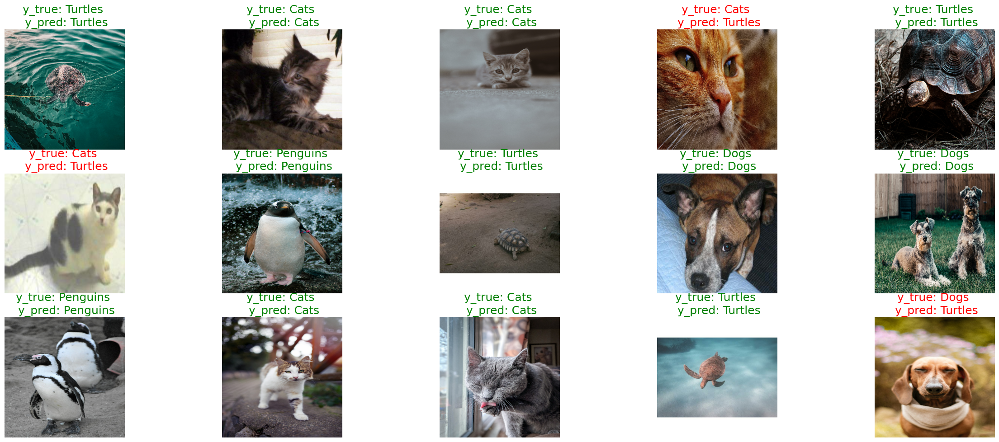

In [123]:
preview_images(train_ds, 30, 20, model_2)

1/1 [==============================] - 0s 19ms/step


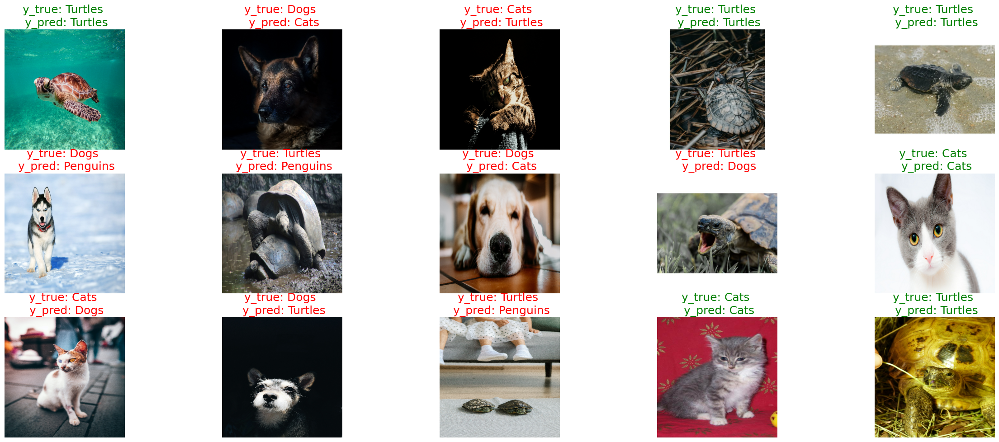

In [124]:
preview_images(val_ds, 30, 20, model_2)

--------

# Confusion Matrix



In [125]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrix(y_true, y_pred, dataset):
    norms = [None, 'all', 'true', 'pred']
    fig, ax = plt.subplots(1, len(norms), figsize=(24, 6))
    for idx, norm in enumerate(norms):
        ConfusionMatrixDisplay.from_predictions(y_true,
                                                y_pred,
                                                labels=np.arange(len(class_names_global)),
                                                normalize=norm,
                                                display_labels=class_names_global,
                                                colorbar=False,
                                                ax=ax[idx],
                                                cmap='Blues')
        ax[idx].set_title(f'Norm={norm}')

In [126]:
def return_y_true_and_pred(dataset, model):
  labels = []
  for img, label in dataset:
    labels.append(label)
  y_true =  list(tf.concat(labels, axis=0).numpy())
  pred = model.predict(dataset)
  pred = np.argmax(pred, axis=1)
  assert len(y_true) == len(pred)
  return y_true, pred

16/16 [==============================] - 2s 125ms/step


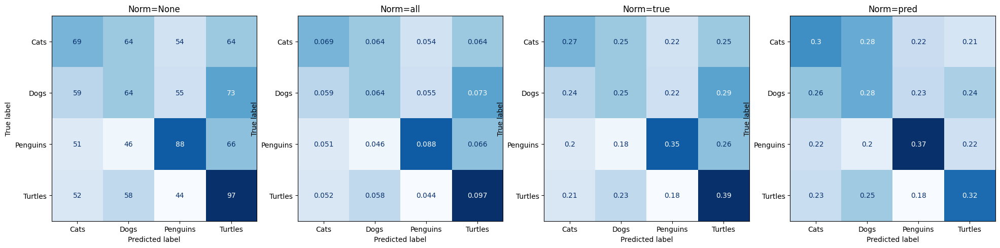

In [127]:
y_true, pred = return_y_true_and_pred(train_ds, model_2)
plot_confusion_matrix(y_true, pred, train_ds)

5/5 [==============================] - 1s 117ms/step


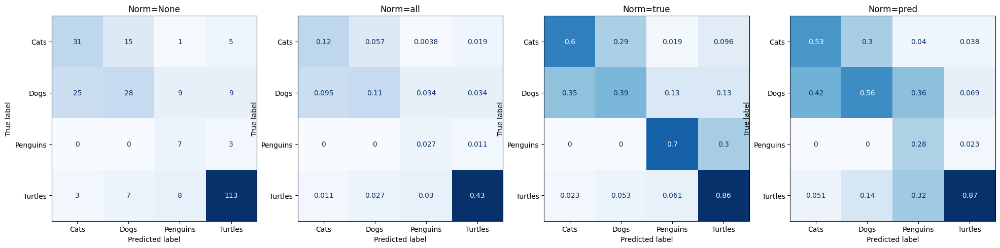

In [128]:
y_true, pred = return_y_true_and_pred(val_ds, model_2)
plot_confusion_matrix(y_true, pred, val_ds)